In [1]:
import os
import math
import torch
import torchvision
import numpy as np
import torch.nn as nn
import seaborn as sns
from torch import optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
import matplotlib.pyplot as plt
from collections import defaultdict
from pytorch_grad_cam import EigenCAM
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
from pytorch_metric_learning import losses
import torchvision.transforms as transforms
from pytorch_grad_cam.utils.image import show_cam_on_image

## Config

In [2]:
BASE_DIR = os.path.dirname(os.getcwd())
DATA_PATH = os.path.join(BASE_DIR, "data", "dataset")

CONFIG = {
    "TRAINSET_DIR": os.path.join(DATA_PATH, "Train"),
    "TESTSET_DIR":  os.path.join(DATA_PATH, "Test"),
    "VALSET_DIR":  os.path.join(DATA_PATH, "Valid"),
    "UNSEEN_DIR":  os.path.join(DATA_PATH, "Unseen"),
    "BATCH_SIZE": 38,
    "EPOCH": 30,
    "IMAGE_SIZE": (224, 224),
    "EMBEDDING_SIZE": 128
}

for key in ["TRAINSET_DIR", "TESTSET_DIR", "VALSET_DIR", "UNSEEN_DIR"]:
    if not os.path.exists(CONFIG[key]):
           print(f"❌ Missing directory: {CONFIG[key]}")

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Helper Function

In [4]:
def imshow(img, text=None):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})

    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

In [5]:
def recall_at_k(embeddings, labels, k=5):
    embeddings = embeddings.to(device)
    labels = labels.to(device)

    cosine_sim = torch.mm(embeddings, embeddings.t())
    _, indices = torch.topk(cosine_sim, k=k+1, dim=1)  # k+1 because first is self
    indices = indices[:, 1:]  # Remove self index

    correct_at_k = 0
    total = len(labels)

    for i in range(total):
        true_label = labels[i].item()
        retrieved_labels = labels[indices[i]].tolist()
        if true_label in retrieved_labels:
            correct_at_k += 1

    recall = correct_at_k / total
    print(f"Recall@{k}: {recall * 100:.2f}%")
    return recall

In [6]:
def denormalize(tensor):
    if tensor.size(0) == 1:  # grayscale
        mean = torch.tensor([0.5]).view(1, 1, 1)
        std = torch.tensor([0.5]).view(1, 1, 1)
    else:  # RGB
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    return tensor * std + mean

In [7]:
def calculate_nn_accuracy(embeddings, labels):
    sim_matrix = torch.matmul(embeddings, embeddings.t())
    batch_size = embeddings.size(0)
    correct = 0
    for i in range(batch_size):
        sim_row = sim_matrix[i].clone()
        sim_row[i] = -1  # Exclude self
        _, idx = torch.max(sim_row, dim=0)
        if labels[i] == labels[idx]:
            correct += 1
    return correct / (batch_size - 1) if batch_size > 1 else 0

In [8]:
def evaluate_model(model, dataloader, loss_fn, device):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs, labels = imgs.to(device), labels.to(device)

            embeddings = model(imgs)
            embeddings = F.normalize(embeddings, p=2, dim=1)  # cosine similarity

            loss = loss_fn(embeddings, labels)
            total_loss += loss.item()

            # Similarity matrix & Top-1 matching (vectorized)
            sim_matrix = torch.matmul(embeddings, embeddings.t())
            sim_matrix.fill_diagonal_(-float('inf'))  # exclude self-match

            _, indices = sim_matrix.max(dim=1)  # top-1 most similar
            matches = labels == labels[indices]
            correct += matches.sum().item()
            total += labels.size(0)

    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total if total > 0 else 0
    return avg_loss, accuracy

In [9]:
def evaluate_per_class_accuracy(model, dataloader, device):
    model.eval()
    
    all_embeddings = []
    all_labels = []
    
    # Step 1: สร้าง embedding และเก็บ label ทั้งหมด
    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs = imgs.to(device)
            embeddings = model(imgs)
            embeddings = F.normalize(embeddings, p=2, dim=1)  # Normalize
            all_embeddings.append(embeddings.cpu())
            all_labels.append(labels.cpu())
    
    all_embeddings = torch.cat(all_embeddings, dim=0)  # shape: [N, embedding_dim]
    all_labels = torch.cat(all_labels, dim=0)          # shape: [N]
    
    # Step 2: คำนวณ similarity matrix ระหว่างทุก embeddings
    sim_matrix = torch.matmul(all_embeddings, all_embeddings.T)  # [N, N]
    
    # Step 3: ไม่ให้ตัวเองเป็น nearest neighbor
    N = sim_matrix.size(0)
    sim_matrix.fill_diagonal_(-float('inf'))
    
    # Step 4: หา nearest neighbor (top-1)
    _, nn_indices = sim_matrix.max(dim=1)  # index ของ nearest neighbor สำหรับแต่ละตัวอย่าง
    
    predicted_labels = all_labels[nn_indices]
    
    # Step 5: คำนวณ accuracy per class
    correct_per_class = defaultdict(int)
    total_per_class = defaultdict(int)
    
    for true_label, pred_label in zip(all_labels, predicted_labels):
        total_per_class[true_label.item()] += 1
        if true_label == pred_label:
            correct_per_class[true_label.item()] += 1
    
    per_class_accuracy = {
        cls: correct_per_class[cls] / total_per_class[cls]
        for cls in total_per_class
    }
    
    return per_class_accuracy

In [10]:
def plot_per_class_accuracy(per_class_acc, class_names):
    classes = []
    accuracies = []

    for cls_id in sorted(per_class_acc.keys()):
        classes.append(class_names[cls_id])
        accuracies.append(per_class_acc[cls_id])

    plt.figure(figsize=(12,6))

    # Generate colors from viridis colormap
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0, 1, len(classes)))

    sns.barplot(x=classes, y=accuracies, palette=colors, legend=False)  # pass colors list as palette

    plt.xlabel("Class")
    plt.ylabel("Accuracy")
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Show percentage accuracy on bars
    for i, acc in enumerate(accuracies):
        plt.text(i, acc + 0.02, f"{acc:.2%}", ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

In [11]:
def visualize_worst_embeddings_cam(
    model, 
    data_loader, 
    cam, 
    denormalize_func, 
    class_names,
    device=None, 
    num_images_per_class=5,   # จำนวนภาพแย่สุดต่อคลาสที่จะแสดง
    classes_to_visualize=None,  # list ของ class ที่อยากแสดง (เช่น class ที่ accuracy ต่ำ)
    rows=5, 
    cols=4
):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    embeddings = []
    labels_list = []
    images_list = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            emb = model(images)
            embeddings.append(emb.cpu())
            labels_list.append(labels.cpu())
            images_list.append(images.cpu())

    embeddings = torch.cat(embeddings)
    labels_list = torch.cat(labels_list)
    images_list = torch.cat(images_list)

    class_centroids = {}
    for label in torch.unique(labels_list):
        class_embeddings = embeddings[labels_list == label]
        class_centroids[label.item()] = class_embeddings.mean(dim=0)

    # ถ้าไม่ได้ระบุ class ที่จะแสดง ให้แสดงทั้งหมด
    if classes_to_visualize is None:
        classes_to_visualize = list(class_centroids.keys())

    # เก็บภาพทั้งหมดที่จะแสดง (dist, index, label)
    images_to_show = []

    for cls in classes_to_visualize:
        class_indices = (labels_list == cls).nonzero(as_tuple=True)[0]
        class_embs = embeddings[class_indices]
        centroid = class_centroids[cls]

        distances = torch.norm(class_embs - centroid.unsqueeze(0), dim=1, p=2)

        # เอา top num_images_per_class ที่ห่าง centroid มากที่สุด (worst)
        worst_distances, worst_indices = torch.topk(distances, k=min(num_images_per_class, len(distances)), largest=True)

        for dist, idx in zip(worst_distances, worst_indices):
            images_to_show.append((dist.item(), class_indices[idx].item(), cls))

    # จัดเรียงภาพจากระยะทางมากไปน้อย (worst ไปน้อยสุด)
    images_to_show.sort(key=lambda x: x[0], reverse=True)

    total_images = len(images_to_show)
    rows = min(rows, (total_images + cols - 1) // cols)  # ปรับ rows ให้พอดีภาพ

    fig, axs = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
    axs = axs.flatten()

    for i, (dist_value, img_idx, label) in enumerate(images_to_show):
        img_tensor = images_list[img_idx]

        input_tensor = img_tensor.unsqueeze(0).to(device)
        input_tensor.requires_grad = True

        img_denorm = denormalize_func(img_tensor)
        img_numpy = np.transpose(img_denorm.numpy(), (1, 2, 0))
        img_numpy = np.clip(img_numpy, 0, 1)

        grayscale_cam = cam(input_tensor=input_tensor, targets=None)[0]
        cam_image = show_cam_on_image(img_numpy, grayscale_cam, use_rgb=True)

        axs[i].imshow(cam_image)
        axs[i].axis('off')
        if class_names is not None:
            axs[i].set_title(f"Dist: {dist_value:.4f}\nLabel: {class_names[label]}", fontsize=10)

    for j in range(total_images, rows*cols):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

## Load Dataset

In [12]:
transform = transforms.Compose([
    transforms.Resize(CONFIG['IMAGE_SIZE']),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [13]:
train_dataset = datasets.ImageFolder(root=CONFIG['TRAINSET_DIR'], transform=transform)
val_dataset = datasets.ImageFolder(root=CONFIG['VALSET_DIR'], transform=transform)
test_dataset = datasets.ImageFolder(root=CONFIG['TESTSET_DIR'], transform=transform)
unseen_dataset = datasets.ImageFolder(root=CONFIG['UNSEEN_DIR'], transform=transform)

In [14]:
dataset_size = len(train_dataset)
BATCH_SIZE = math.ceil(dataset_size / CONFIG["BATCH_SIZE"])

In [15]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)
unseen_loader = DataLoader(unseen_dataset, batch_size=BATCH_SIZE, shuffle=True)

## Setup

In [16]:
class DeepSearchShoeModel(nn.Module):
      def __init__(self, embedding_size=128):
          super(DeepSearchShoeModel, self).__init__()

          self.backbone = torchvision.models.resnet18(pretrained=True)

          in_dim = self.backbone.fc.in_features
          self.backbone.fc = nn.Identity()
          self.fc = nn.Linear(in_dim, embedding_size)
          self.dropout = nn.Dropout(0.3)

      def forward(self, x):
          feat = self.backbone(x)
          emb = self.fc(feat)
          emb = self.dropout(emb)
          emb = F.normalize(emb, p=2, dim=1)
          return emb

## Training

In [17]:
model = DeepSearchShoeModel(embedding_size=CONFIG['EMBEDDING_SIZE']).to(device)
loss_fn = losses.MultiSimilarityLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

/opt/anaconda3/envs/deep_search/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/deep_search/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [18]:
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

for epoch in range(CONFIG['EPOCH']):
    model.train()
    running_loss = 0.0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)

        embeddings = model(imgs)

        loss = loss_fn(embeddings, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    scheduler.step()

    # ==== Evaluate Train ====
    avg_train_loss, train_acc = evaluate_model(model, train_loader, loss_fn, device)
    train_losses.append(avg_train_loss)
    train_accuracies.append(train_acc)

    # ==== Evaluate Val ====
    avg_val_loss, val_acc = evaluate_model(model, val_loader, loss_fn, device)
    val_losses.append(avg_val_loss)
    val_accuracies.append(val_acc)

    print(f"Epoch {epoch+1}/{CONFIG['EPOCH']} | "
          f"Train Loss: {avg_train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {avg_val_loss:.4f} | Val Acc: {val_acc:.4f}")

Epoch 1/30 | Train Loss: 0.7391 | Train Acc: 0.4185 | Val Loss: 0.5700 | Val Acc: 0.5333
Epoch 2/30 | Train Loss: 0.6002 | Train Acc: 0.6374 | Val Loss: 0.3846 | Val Acc: 0.4667
Epoch 3/30 | Train Loss: 0.6366 | Train Acc: 0.6493 | Val Loss: 0.3971 | Val Acc: 0.5667
Epoch 4/30 | Train Loss: 0.6075 | Train Acc: 0.6813 | Val Loss: 0.4980 | Val Acc: 0.4833
Epoch 5/30 | Train Loss: 0.5128 | Train Acc: 0.7372 | Val Loss: 0.3358 | Val Acc: 0.6500
Epoch 6/30 | Train Loss: 0.4607 | Train Acc: 0.7793 | Val Loss: 0.3706 | Val Acc: 0.6000
Epoch 7/30 | Train Loss: 0.4541 | Train Acc: 0.8114 | Val Loss: 0.3668 | Val Acc: 0.6500
Epoch 8/30 | Train Loss: 0.2902 | Train Acc: 0.8471 | Val Loss: 0.2387 | Val Acc: 0.7500
Epoch 9/30 | Train Loss: 0.3428 | Train Acc: 0.8388 | Val Loss: 0.3383 | Val Acc: 0.7333
Epoch 10/30 | Train Loss: 0.2971 | Train Acc: 0.8324 | Val Loss: 0.3333 | Val Acc: 0.6500
Epoch 11/30 | Train Loss: 0.2810 | Train Acc: 0.8452 | Val Loss: 0.3262 | Val Acc: 0.6333
Epoch 12/30 | Train

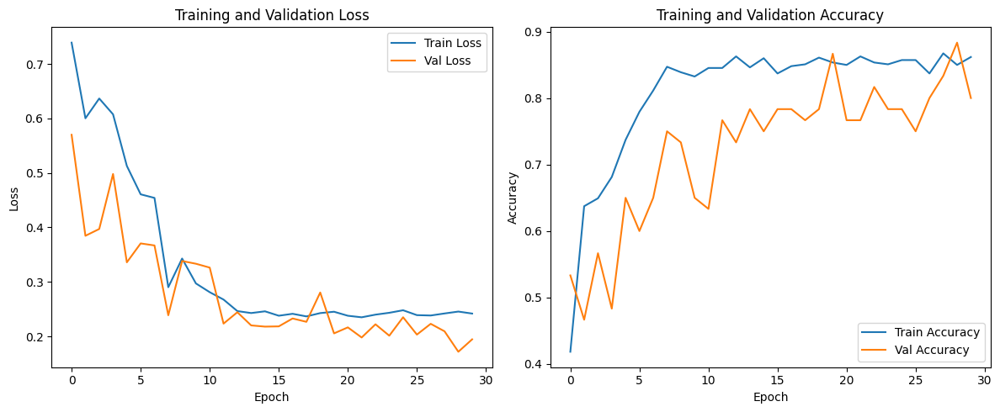

In [19]:
plt.figure(figsize=(12,5))

# กราฟ Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# กราฟ Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Explainable AI

In [20]:
target_layers = [model.backbone.layer4[-1]]
cam = EigenCAM(model=model, target_layers=target_layers)

## Evaluate

In [21]:
model.eval()

DeepSearchShoeModel(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tr

In [22]:
final_train_loss, final_train_acc = evaluate_model(model, train_loader, loss_fn, device)
final_test_loss, final_test_acc = evaluate_model(model, test_loader, loss_fn, device)  # หรือ val_loader ถ้าไม่มี test set

print("\n=== Final Evaluation ===")
print(f"Train Loss: {final_train_loss:.4f}, Train Acc: {final_train_acc:.4f}")
print(f"Test Loss:  {final_test_loss:.4f}, Test Acc:  {final_test_acc:.4f}")


=== Final Evaluation ===
Train Loss: 0.2438, Train Acc: 0.8608
Test Loss:  0.3202, Test Acc:  0.8103


### Accuracy Per Class

#### Train set

/var/folders/lw/7h861m316mj48mmqts7789f80000gn/T/ipykernel_6137/2011221192.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=accuracies, palette=colors, legend=False)  # pass colors list as palette
/var/folders/lw/7h861m316mj48mmqts7789f80000gn/T/ipykernel_6137/2011221192.py:15: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x=classes, y=accuracies, palette=colors, legend=False)  # pass colors list as palette


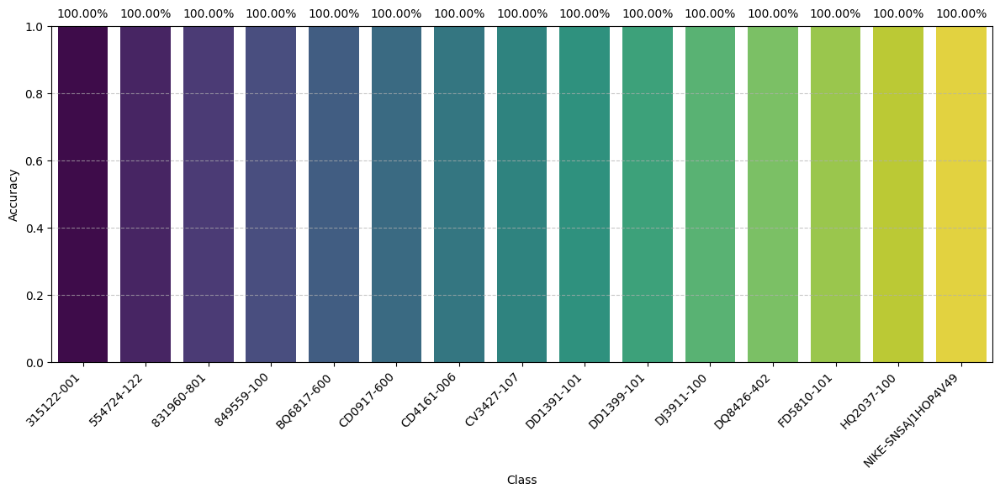

In [23]:
accuracies = evaluate_per_class_accuracy(model, train_loader, device)
class_names = train_dataset.classes
worst_classes = sorted(accuracies, key=accuracies.get)[:10]

plot_per_class_accuracy(accuracies, class_names)

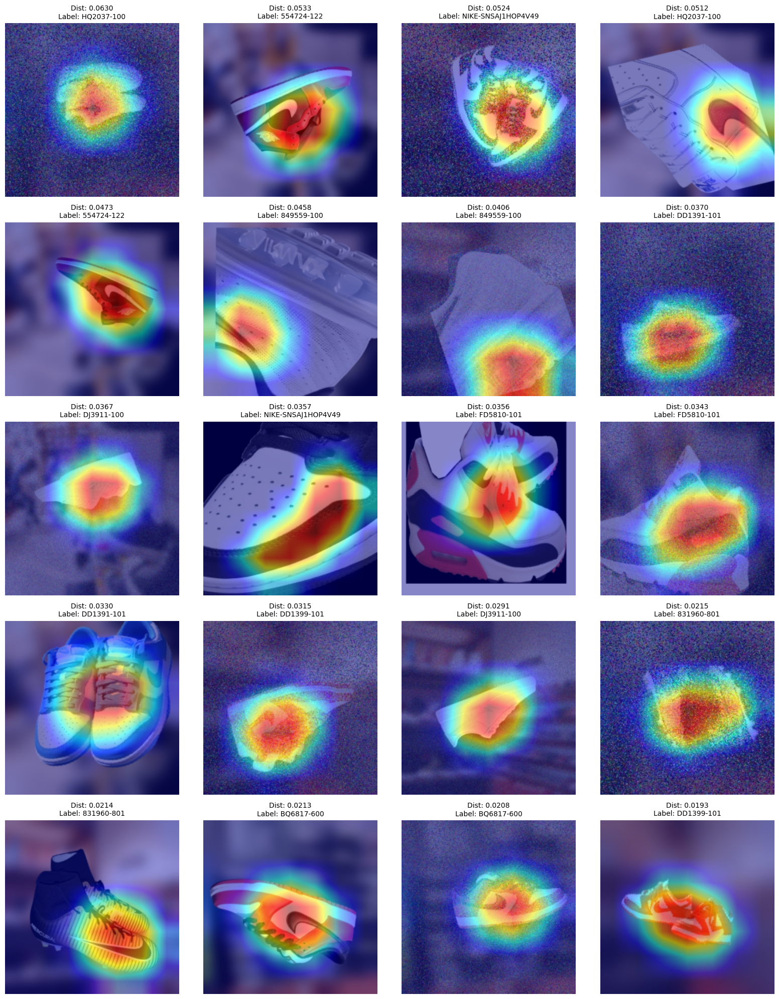

In [24]:
visualize_worst_embeddings_cam(model, train_loader, cam, denormalize, class_names, device, num_images_per_class=2, classes_to_visualize=worst_classes)

### Test set

C:\Users\phoom\AppData\Local\Temp\ipykernel_28748\2011221192.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=accuracies, palette=colors, legend=False)  # pass colors list as palette
C:\Users\phoom\AppData\Local\Temp\ipykernel_28748\2011221192.py:15: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x=classes, y=accuracies, palette=colors, legend=False)  # pass colors list as palette


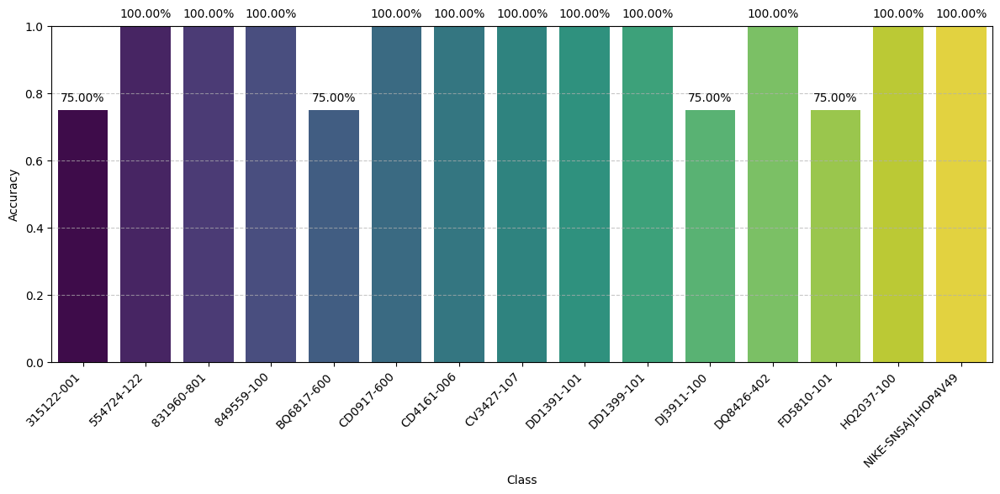

In [25]:
accuracies = evaluate_per_class_accuracy(model, test_loader, device)
class_names = test_dataset.classes
worst_classes = sorted(accuracies, key=accuracies.get)[:10]

plot_per_class_accuracy(accuracies, class_names)

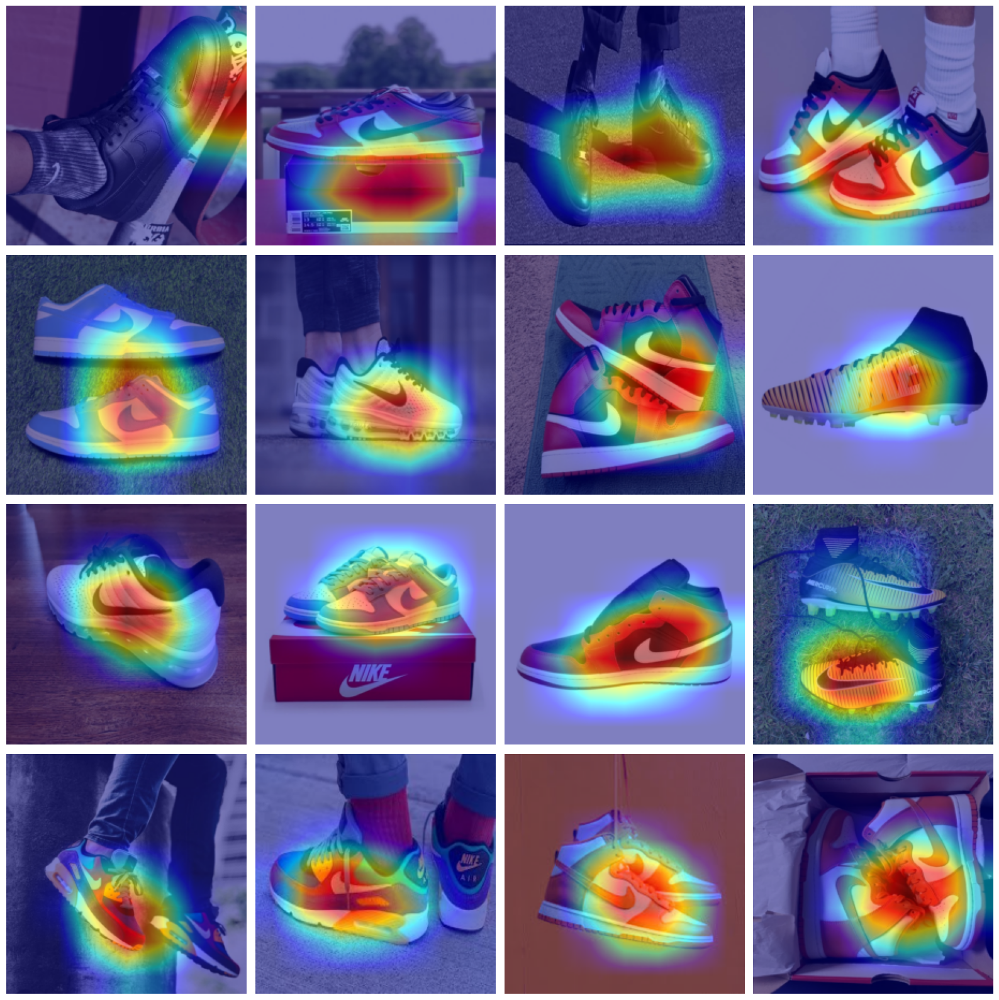

In [ ]:
visualize_worst_embeddings_cam(model, test_loader, cam, denormalize, class_names, device, num_images_per_class=2, classes_to_visualize=worst_classes)

### Unseen set

C:\Users\phoom\AppData\Local\Temp\ipykernel_28748\2011221192.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=accuracies, palette=colors, legend=False)  # pass colors list as palette
C:\Users\phoom\AppData\Local\Temp\ipykernel_28748\2011221192.py:15: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x=classes, y=accuracies, palette=colors, legend=False)  # pass colors list as palette


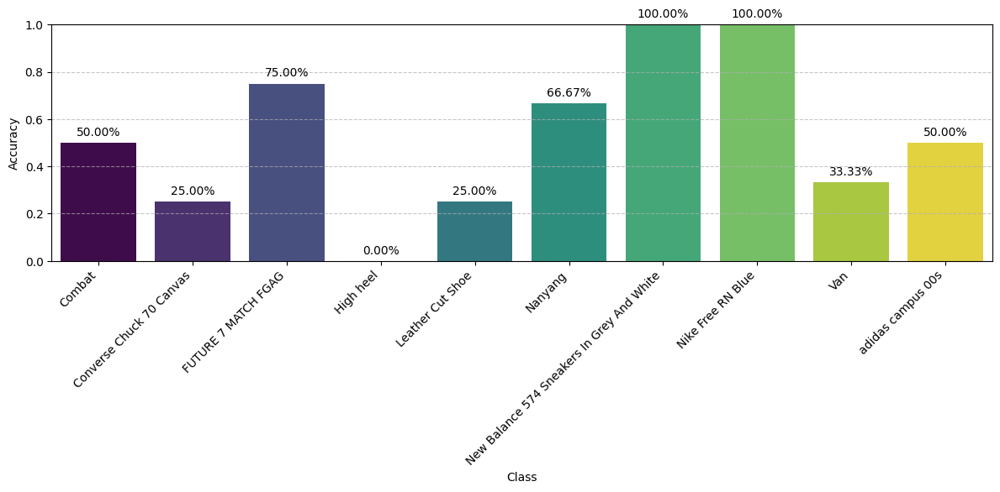

In [34]:
accuracies = evaluate_per_class_accuracy(model, unseen_loader, device)
class_names = unseen_dataset.classes
worst_classes = sorted(accuracies, key=accuracies.get)[:8]

plot_per_class_accuracy(accuracies, class_names)

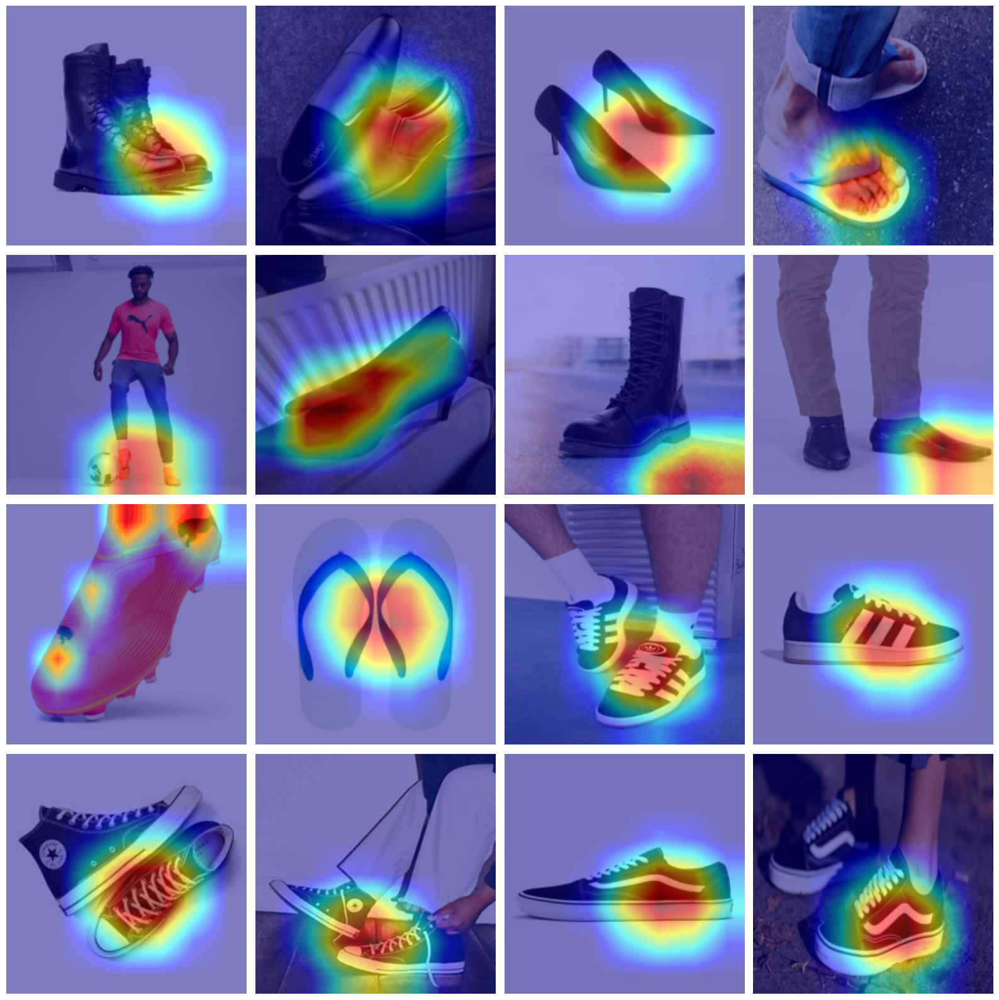

In [ ]:
visualize_worst_embeddings_cam(model, unseen_loader, cam, denormalize, class_names, device, num_images_per_class=2, classes_to_visualize=worst_classes)

## Export

In [ ]:
torch.save(model.state_dict(), 'deep_search_shoe_model.pth')